<a href="https://colab.research.google.com/github/MoMus2000/DCGAN-/blob/master/Art.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import os
import tensorflow as tf
from tensorflow.keras.layers import Dense,Flatten,Conv2D,Conv2DTranspose,Reshape,LeakyReLU,Dropout,BatchNormalization,Activation,UpSampling2D,MaxPooling2D
from tensorflow.keras.models import Sequential
import time
from tensorflow.keras.optimizers import SGD,Adam,RMSprop
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt


In [2]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


In [3]:
! kaggle datasets download -d ikarus777/best-artworks-of-all-time

100% 2.28G/2.29G [01:02<00:00, 55.7MB/s]
100% 2.29G/2.29G [01:03<00:00, 38.6MB/s]


In [4]:
!unzip /content/best-artworks-of-all-time.zip

Streaming output truncated to the last 5000 lines.
  inflating: resized/resized/Henri_Rousseau_62.jpg  
  inflating: resized/resized/Henri_Rousseau_63.jpg  
  inflating: resized/resized/Henri_Rousseau_64.jpg  
  inflating: resized/resized/Henri_Rousseau_65.jpg  
  inflating: resized/resized/Henri_Rousseau_66.jpg  
  inflating: resized/resized/Henri_Rousseau_67.jpg  
  inflating: resized/resized/Henri_Rousseau_68.jpg  
  inflating: resized/resized/Henri_Rousseau_69.jpg  
  inflating: resized/resized/Henri_Rousseau_7.jpg  
  inflating: resized/resized/Henri_Rousseau_70.jpg  
  inflating: resized/resized/Henri_Rousseau_8.jpg  
  inflating: resized/resized/Henri_Rousseau_9.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_1.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_10.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_11.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_12.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_13.jpg

In [5]:
folder = []
def load_Image(folder):
    images = []
    for j in range(len(folder)):
        for filename in os.listdir(folder[j]):
            img = cv2.imread(os.path.join(folder[j],filename))
            img = cv2.resize(img,(64,64))
            if img is not None:
                images.append(img)
    return np.asarray(images)

test = ['/content/resized/resized']
x = load_Image(test)


In [6]:
x = (x - 127.5) / 127.5

In [ ]:
# dis_learning_rate =  0.0002 
# gen_learning_rate =  0.0002
# dis_momentum = 0.9
# gen_momentum = 0.9
# dis_nesterov = True
# gen_nesterov = True

# dis_optimizer = Adam(lr=dis_learning_rate, beta_1=0.5)
# gen_optimizer = Adam(lr=gen_learning_rate, beta_1=0.5)
lr =  0.0002
beta1 = 0.5
dis_optimizer = Adam(lr=lr, beta1=beta1)
gen_optimizer = RMSprop(lr=lr, beta1=beta1)
gen_model = Sequential()
gen_model.add(Dense(units=2048))
gen_model.add(Activation('tanh'))
gen_model.add(Dense(256 * 8 * 8, activation = 'relu'))
gen_model.add(BatchNormalization())
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(Reshape((8, 8, 256), input_shape=(256 * 8 * 8,)))
gen_model.add(UpSampling2D(size=(2, 2)))
gen_model.add(Conv2D(1024, (5, 5), padding='same',activation = 'relu'))
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(BatchNormalization())
gen_model.add(UpSampling2D(size=(2, 2)))
gen_model.add(Conv2D(512, (5, 5), padding='same',activation = 'relu'))
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(BatchNormalization())
gen_model.add(Conv2D(256, (5, 5), padding='same', activation = 'relu'))
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(BatchNormalization())
gen_model.add(Conv2D(128, (5, 5), padding='same', activation = 'relu'))
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(BatchNormalization())
gen_model.add(UpSampling2D(size=(2, 2)))
gen_model.add(Conv2D(3, (5, 5), padding='same', activation = 'relu'))
gen_model.add(LeakyReLU(alpha=0.2))
gen_model.add(Activation('tanh'))






In [ ]:
dis_model = Sequential()
dis_model.add(
Conv2D(256, (5, 5),
padding='same',
input_shape=(64, 64, 3))
)
dis_model.add(LeakyReLU(alpha=0.2))
dis_model.add(MaxPooling2D(pool_size=(2, 2)))
dis_model.add(Conv2D(256, (3, 3)))
dis_model.add(LeakyReLU(alpha=0.2))
dis_model.add(BatchNormalization())
dis_model.add(MaxPooling2D(pool_size=(2, 2)))
dis_model.add(Conv2D(256, (3, 3)))
dis_model.add(LeakyReLU(alpha=0.2))
dis_model.add(BatchNormalization())
dis_model.add(MaxPooling2D(pool_size=(2, 2)))
dis_model.add(Conv2D(512, (3, 3)))
dis_model.add(LeakyReLU(alpha=0.2))
dis_model.add(BatchNormalization())
dis_model.add(MaxPooling2D(pool_size=(2, 2)))
dis_model.add(Flatten())
dis_model.add(Dense(1024))
dis_model.add(LeakyReLU(alpha=0.2))
dis_model.add(BatchNormalization())
dis_model.add(Dense(1))
dis_model.add(Activation('sigmoid'))
dis_model.compile(loss='binary_crossentropy',
optimizer=dis_optimizer)

In [ ]:
GAN = Sequential([gen_model,dis_model])
dis_model.trainable = False
GAN.compile(loss='binary_crossentropy',
optimizer=gen_optimizer)

In [ ]:
batch_size = 64
my_data = x
dataset = tf.data.Dataset.from_tensor_slices(my_data).shuffle(buffer_size =1000)
dataset = dataset.batch(batch_size,drop_remainder=True).prefetch(1)

In [ ]:
epochs=2000

generator, discriminator = GAN.layers


Currently on epoch 1
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.00013574716285802424 and Discriminator loss: 1.027005282594473e-06


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

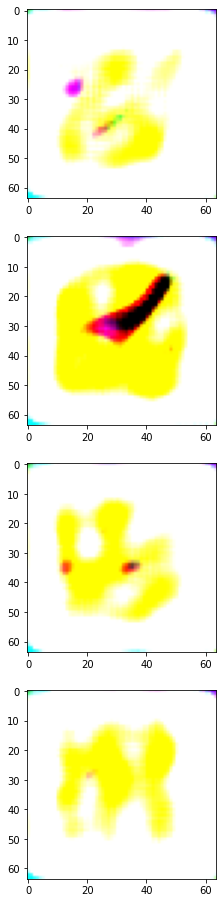

Currently on epoch 2
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.04148704558610916 and Discriminator loss: 0.0038019269704818726
Currently on epoch 3
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.006255969870835543 and Discriminator loss: 0.0004136127536185086


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

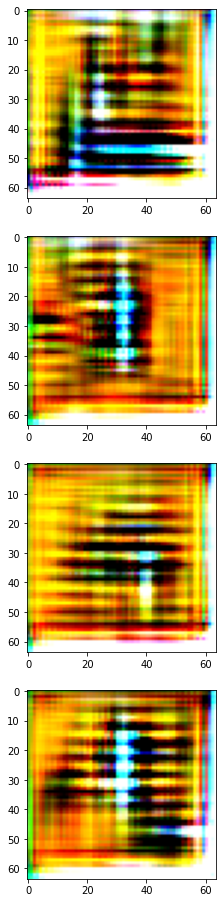

Currently on epoch 5
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.02029566280543804 and Discriminator loss: 0.0025319941341876984
Currently on epoch 6
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.12333228439092636 and Discriminator loss: 0.11379379034042358


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

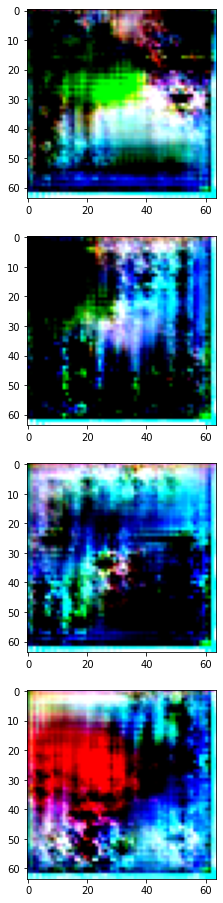

Currently on epoch 8
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 1.0585920810699463 and Discriminator loss: 0.7054167985916138
Currently on epoch 9
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.10391063988208771 and Discriminator loss: 0.00703493133187294


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

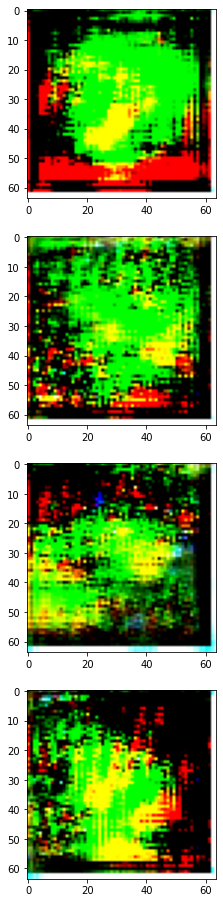

Currently on epoch 11
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 4.01503849029541 and Discriminator loss: 0.20228829979896545
Currently on epoch 12
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 13

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 5.294554710388184 and Discriminator loss: 0.18701621890068054


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

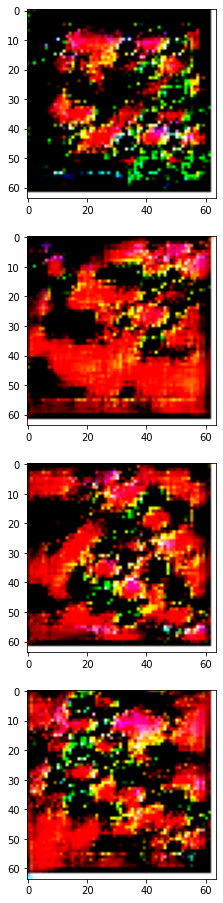

Currently on epoch 14
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.7243435382843018 and Discriminator loss: 0.099302276968956
Currently on epoch 15
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 13

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 3.252979278564453 and Discriminator loss: 0.006589806172996759


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

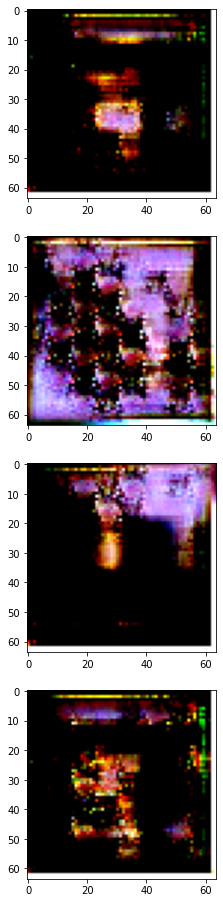

Currently on epoch 17
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 3.1530704498291016 and Discriminator loss: 0.02604910545051098
Currently on epoch 18
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.06713564693927765 and Discriminator loss: 0.0020692204125225544


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

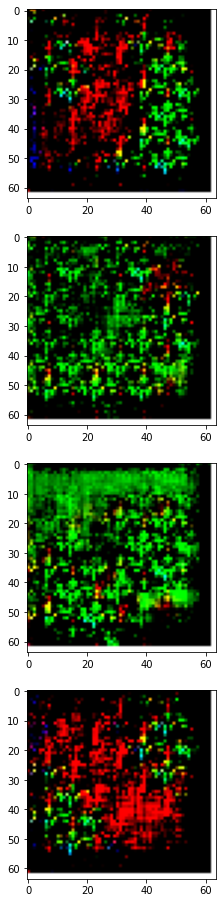

Currently on epoch 20
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 1.1753053665161133 and Discriminator loss: 0.01925639621913433
Currently on epoch 21
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.029188625514507294 and Discriminator loss: 0.00034453553962521255


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

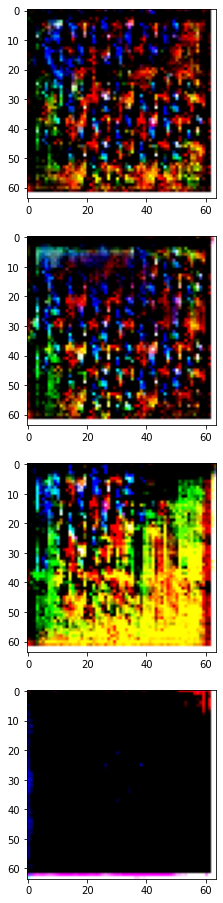

Currently on epoch 23
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 9.61269760131836 and Discriminator loss: 0.0031571872532367706
Currently on epoch 24
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 3.4637887477874756 and Discriminator loss: 0.004577891901135445


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

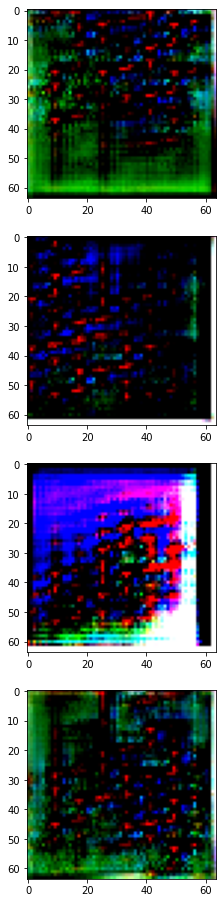

Currently on epoch 26
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.02559821307659149 and Discriminator loss: 0.023264404386281967
Currently on epoch 27
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.007637361064553261 and Discriminator loss: 0.00027411742485128343


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

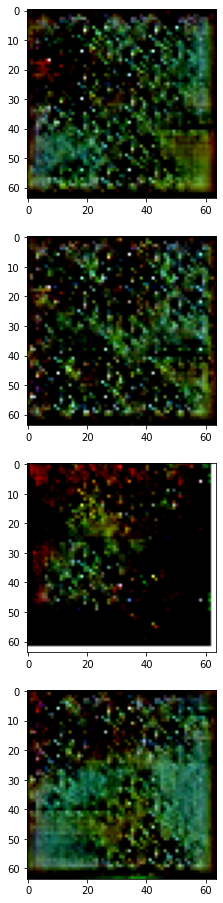

Currently on epoch 29
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0381077416241169 and Discriminator loss: 0.00047297042328864336
Currently on epoch 30
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 2.0222678184509277 and Discriminator loss: 0.009070995263755322


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

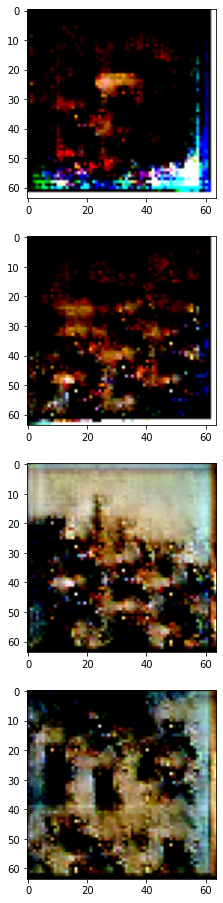

Currently on epoch 32
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0005731013370677829 and Discriminator loss: 0.00019342973246239126
Currently on epoch 33
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.14621995389461517 and Discriminator loss: 0.006405070424079895


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

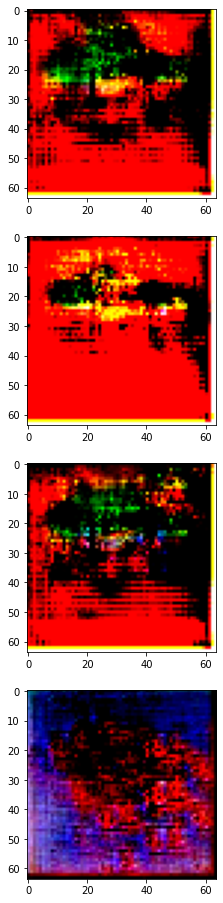

Currently on epoch 35
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0393168106675148 and Discriminator loss: 0.004548313096165657
Currently on epoch 36
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.028163716197013855 and Discriminator loss: 0.0003077027795370668


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

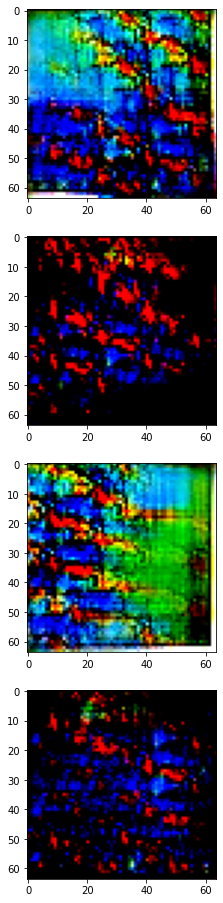

Currently on epoch 38
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0016548528801649809 and Discriminator loss: 6.817921075708e-06
Currently on epoch 39
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.009560332633554935 and Discriminator loss: 0.0003547003143467009


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

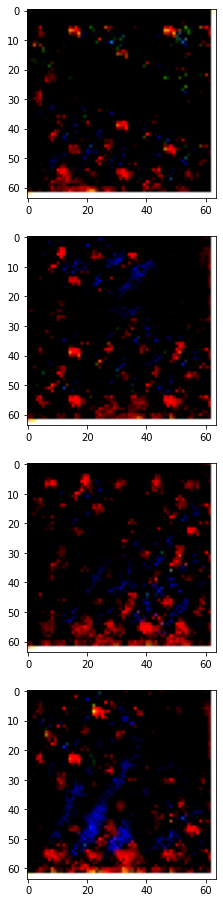

Currently on epoch 41
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0021929279901087284 and Discriminator loss: 0.0021852997597306967
Currently on epoch 42
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.004262787289917469 and Discriminator loss: 0.0007908092229627073


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

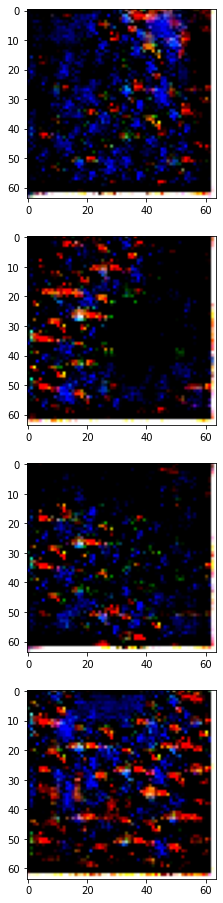

Currently on epoch 44
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.07009778916835785 and Discriminator loss: 0.008310908451676369
Currently on epoch 45
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.019184961915016174 and Discriminator loss: 0.000555297068785876


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

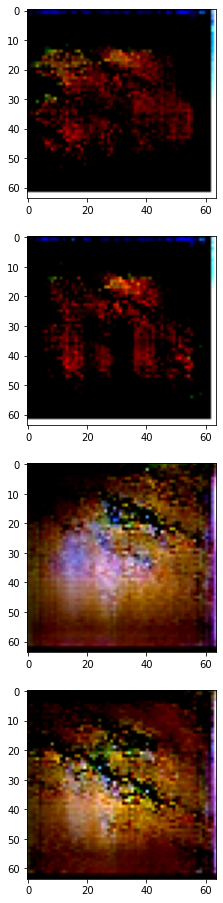

Currently on epoch 47
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.006957001518458128 and Discriminator loss: 0.00017896479403134435
Currently on epoch 48
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0047297696582973 and Discriminator loss: 2.2095366148278117e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

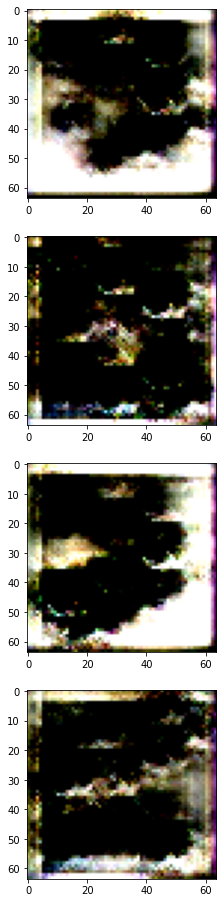

Currently on epoch 50
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.13748185336589813 and Discriminator loss: 0.0001341650786343962
Currently on epoch 51
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0015031634829938412 and Discriminator loss: 9.402892465004697e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

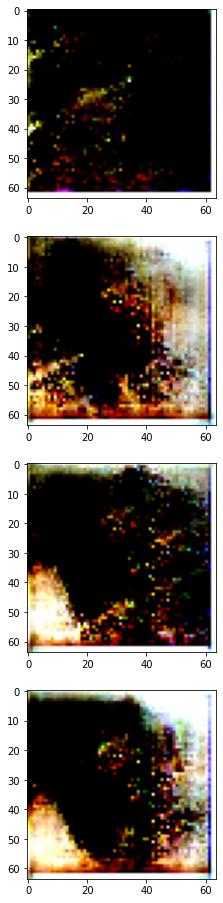

Currently on epoch 53
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.38897302746772766 and Discriminator loss: 0.016380328685045242
Currently on epoch 54
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.2646317780017853 and Discriminator loss: 0.04465259239077568


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

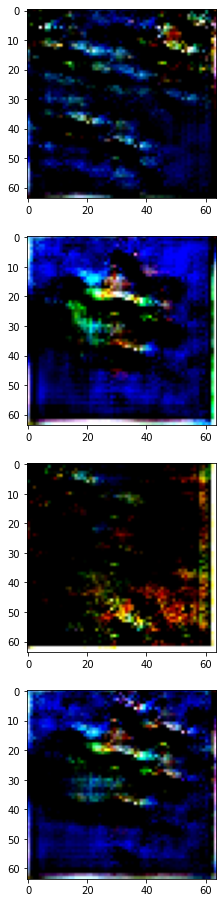

Currently on epoch 56
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0002385125553701073 and Discriminator loss: 0.0007713426603004336
Currently on epoch 57
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.01450941152870655 and Discriminator loss: 0.0002894433564506471


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

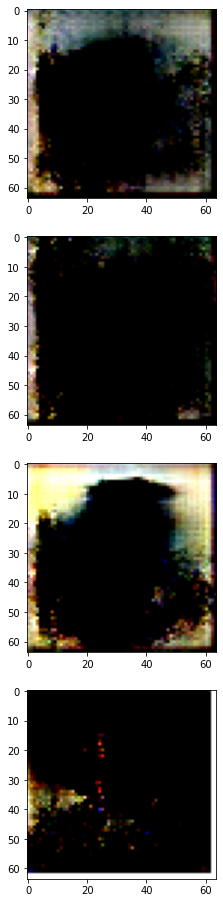

Currently on epoch 59
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.007601142395287752 and Discriminator loss: 0.0003107575757894665
Currently on epoch 60
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.08237618207931519 and Discriminator loss: 0.0007946343393996358


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

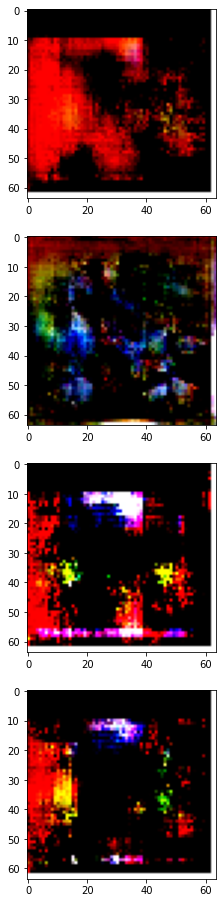

Currently on epoch 62
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.008371242322027683 and Discriminator loss: 0.0009728919249027967
Currently on epoch 63
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.09688716381788254 and Discriminator loss: 0.013363858684897423


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

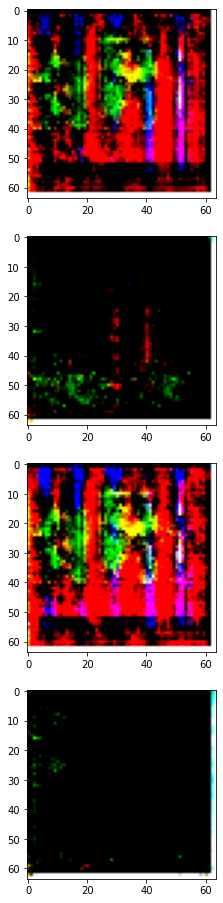

Currently on epoch 65
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.09526445716619492 and Discriminator loss: 0.00017795295570977032
Currently on epoch 66
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.00921700894832611 and Discriminator loss: 9.193313599098474e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

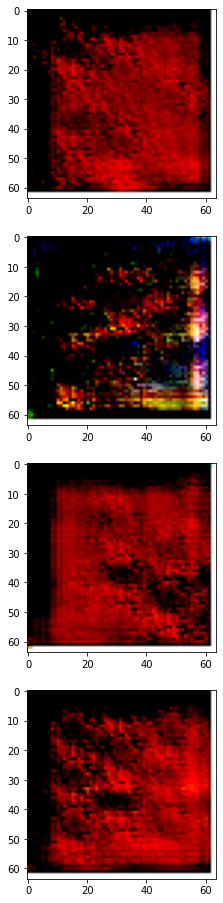

Currently on epoch 68
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.000762982526794076 and Discriminator loss: 2.2677415472571738e-05
Currently on epoch 69
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0064076632261276245 and Discriminator loss: 0.00039414747152477503


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

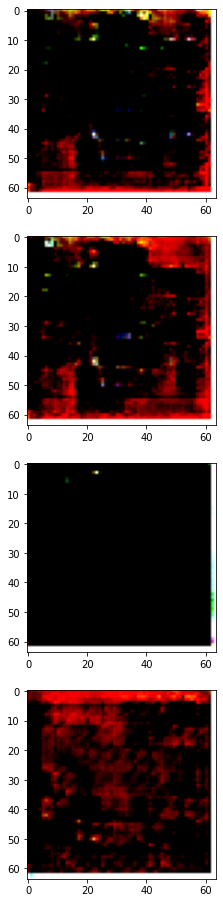

Currently on epoch 71
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.4287586808204651 and Discriminator loss: 0.022700976580381393
Currently on epoch 72
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.05547736585140228 and Discriminator loss: 0.0007475910824723542


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

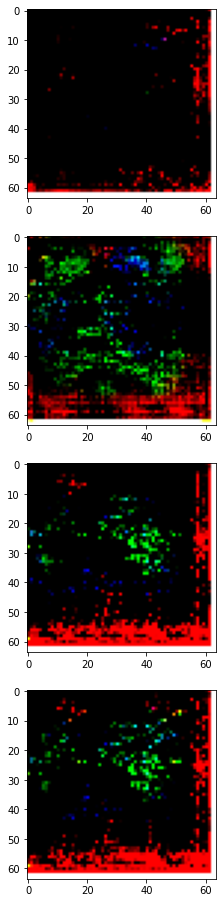

Currently on epoch 74
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.001791425864212215 and Discriminator loss: 7.766648923279718e-05
Currently on epoch 75
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.01000477559864521 and Discriminator loss: 0.0007602619589306414


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

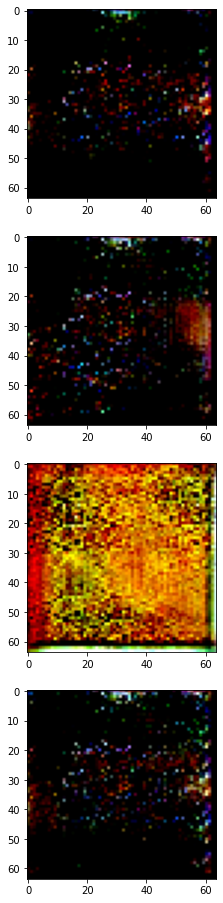

Currently on epoch 77
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 14.582657814025879 and Discriminator loss: 2.7526488338480704e-05
Currently on epoch 78
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.01606101170182228 and Discriminator loss: 0.00011385772813810036


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

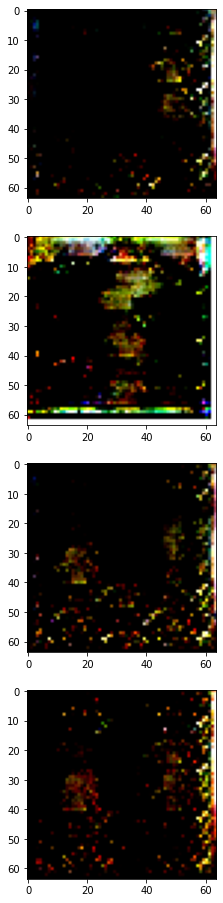

Currently on epoch 80
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.018880056217312813 and Discriminator loss: 0.00010030171688413247
Currently on epoch 81
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.039574794471263885 and Discriminator loss: 0.0006912011886015534


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

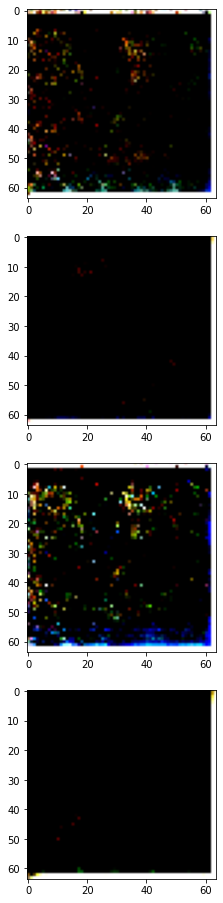

Currently on epoch 83
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.05230552703142166 and Discriminator loss: 4.23295859945938e-05
Currently on epoch 84
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.008488347753882408 and Discriminator loss: 6.2762395828031e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

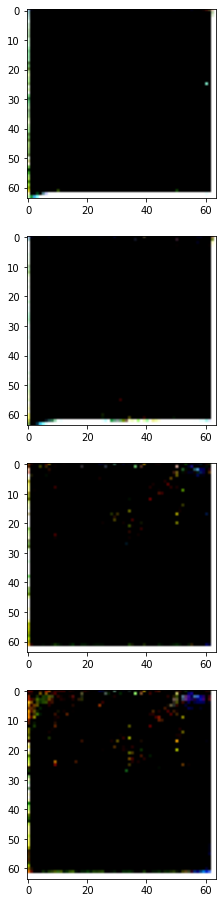

Currently on epoch 86
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.022983260452747345 and Discriminator loss: 2.5698122044559568e-05
Currently on epoch 87
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.007949573919177055 and Discriminator loss: 0.00023877076455391943


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

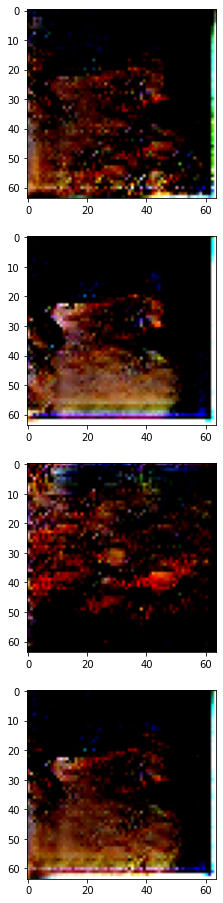

Currently on epoch 89
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0007059315103106201 and Discriminator loss: 2.33666487474693e-05
Currently on epoch 90
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.03916556388139725 and Discriminator loss: 0.00022327994520310313


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

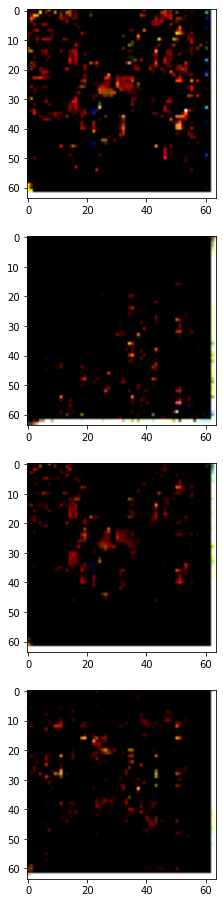

Currently on epoch 92
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.11634551733732224 and Discriminator loss: 1.0771015695354436e-05
Currently on epoch 93
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.00077701301779598 and Discriminator loss: 3.546586640368332e-06


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

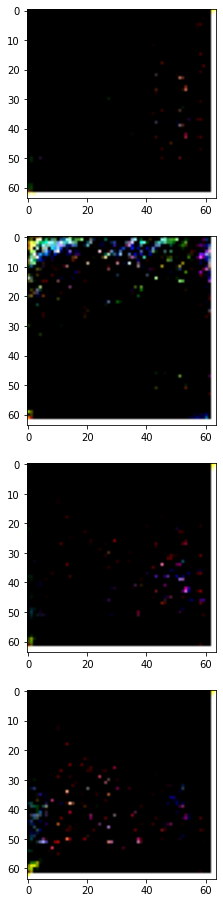

Currently on epoch 95
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.009829012677073479 and Discriminator loss: 1.9041679479414597e-05
Currently on epoch 96
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0007888233521953225 and Discriminator loss: 1.9784802134381607e-06


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

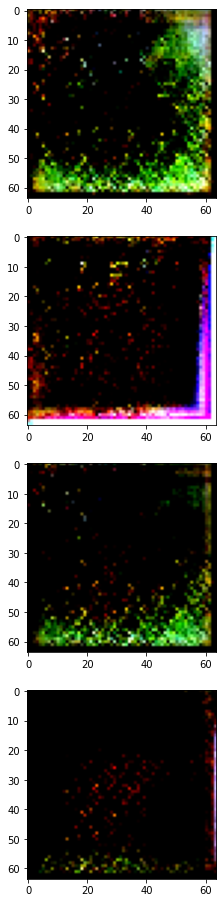

Currently on epoch 98
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 2.006547212600708 and Discriminator loss: 0.0046688951551914215
Currently on epoch 99
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.07399259507656097 and Discriminator loss: 0.0003178340557496995


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

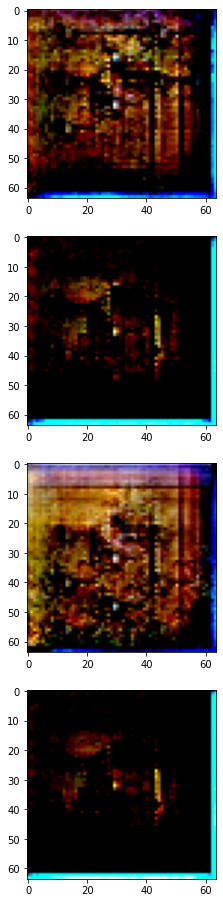

Currently on epoch 101
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.06538793444633484 and Discriminator loss: 0.00022532591538038105
Currently on epoch 102
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.005780096631497145 and Discriminator loss: 0.00018616527086123824


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

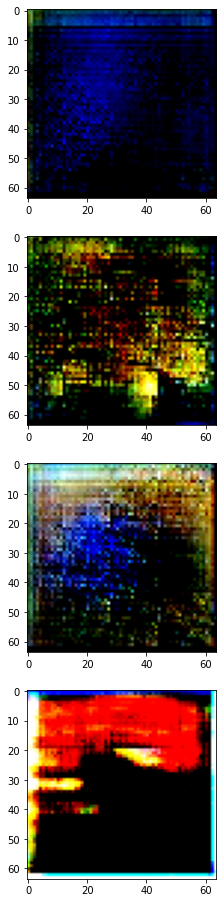

Currently on epoch 104
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0019788965582847595 and Discriminator loss: 3.591860149754211e-05
Currently on epoch 105
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.17854043841362 and Discriminator loss: 0.00030010135378688574


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

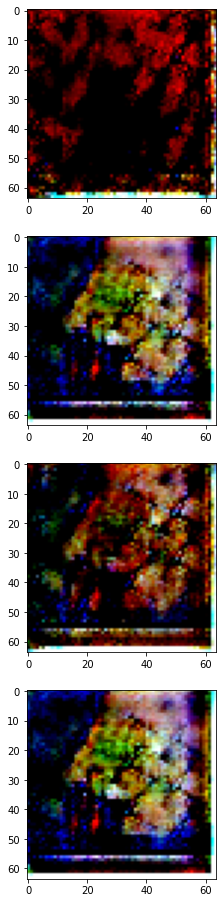

Currently on epoch 107
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 10.210039138793945 and Discriminator loss: 0.017518913373351097
Currently on epoch 108
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.012979123741388321 and Discriminator loss: 5.046295336796902e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

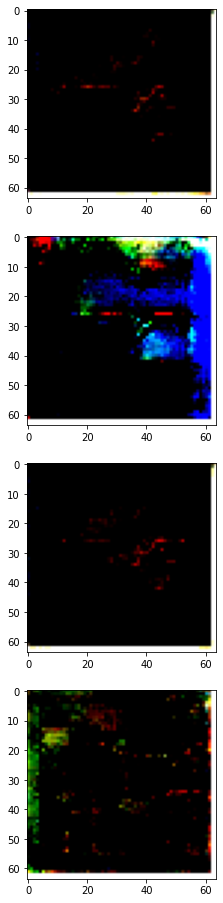

Currently on epoch 110
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.16343370079994202 and Discriminator loss: 0.002058823127299547
Currently on epoch 111
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.013186072930693626 and Discriminator loss: 9.530547686154023e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

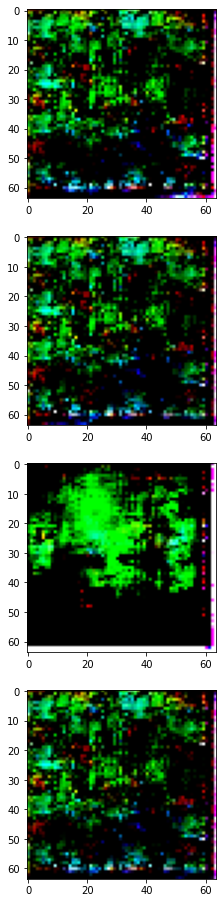

Currently on epoch 113
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0009636194445192814 and Discriminator loss: 3.373173240106553e-05
Currently on epoch 114
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.4569424092769623 and Discriminator loss: 0.00022446953516919166


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

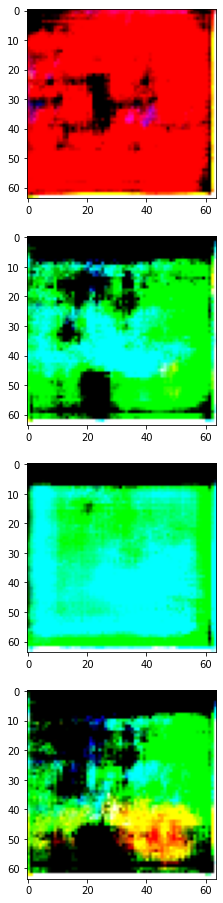

Currently on epoch 116
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0020090006291866302 and Discriminator loss: 6.596444291062653e-05
Currently on epoch 117
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0004616316291503608 and Discriminator loss: 4.760598676512018e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

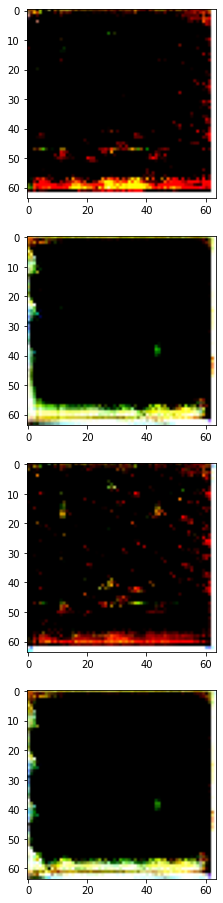

Currently on epoch 119
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0032042418606579304 and Discriminator loss: 0.0005198439466767013
Currently on epoch 120
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 5.1957197189331055 and Discriminator loss: 0.0008710116962902248


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

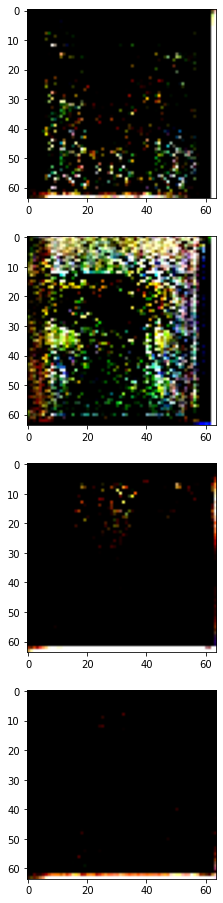

Currently on epoch 122
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 11.398011207580566 and Discriminator loss: 0.2263622134923935
Currently on epoch 123
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.009362049400806427 and Discriminator loss: 5.806780973216519e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

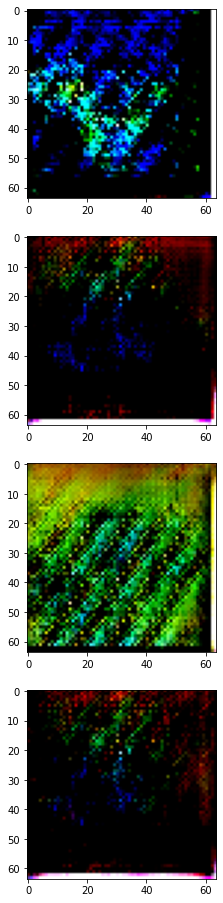

Currently on epoch 125
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 2.680537223815918 and Discriminator loss: 0.0003061724710278213
Currently on epoch 126
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.017930176109075546 and Discriminator loss: 1.3016808225074783e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

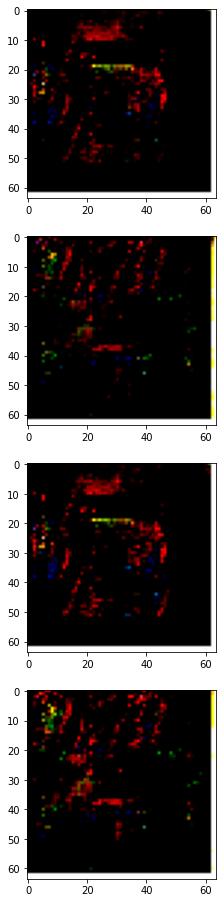

Currently on epoch 128
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.005968533456325531 and Discriminator loss: 0.00034775352105498314
Currently on epoch 129
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.011371816508471966 and Discriminator loss: 3.73480943380855e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

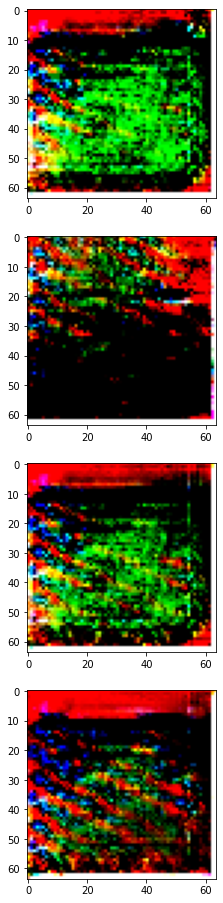

Currently on epoch 131
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.008990867994725704 and Discriminator loss: 2.8198348445584998e-05
Currently on epoch 132
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.07239650189876556 and Discriminator loss: 0.00031429380760528147


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

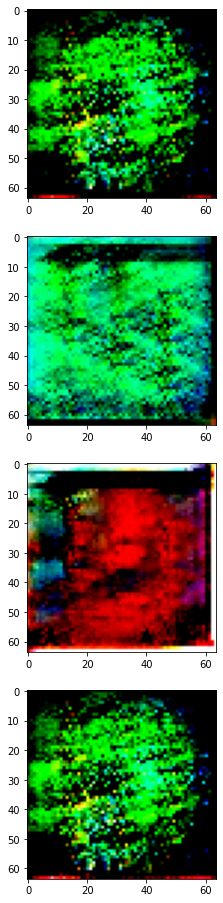

Currently on epoch 134
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.2329961210489273 and Discriminator loss: 0.00025652095791883767
Currently on epoch 135
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.042140617966651917 and Discriminator loss: 0.00027607998345047235


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

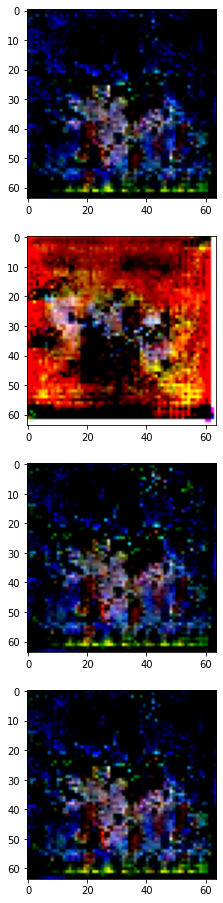

Currently on epoch 137
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 1.1007819175720215 and Discriminator loss: 0.007531182374805212
Currently on epoch 138
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.004701334051787853 and Discriminator loss: 0.0013781754532828927


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

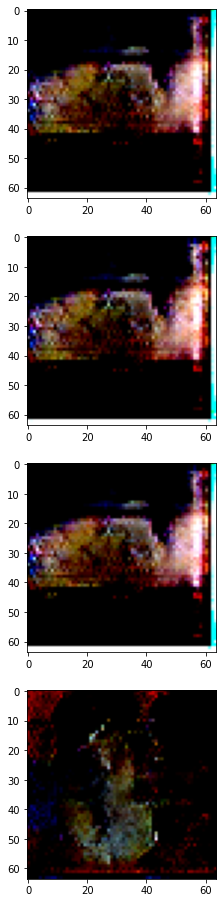

Currently on epoch 140
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 3.6906237602233887 and Discriminator loss: 0.0007894365699030459
Currently on epoch 141
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0005766949616372585 and Discriminator loss: 3.216891491319984e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

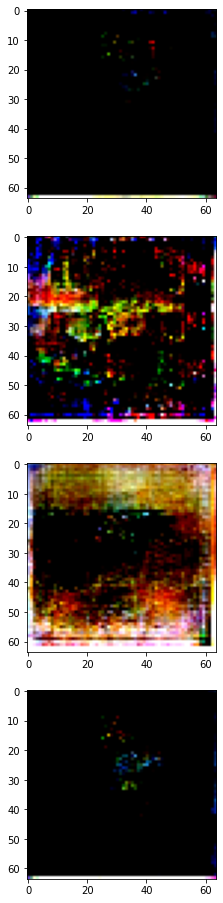

Currently on epoch 143
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.014266230165958405 and Discriminator loss: 7.5782527346746065e-06
Currently on epoch 144
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0015099026495590806 and Discriminator loss: 2.395682895439677e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

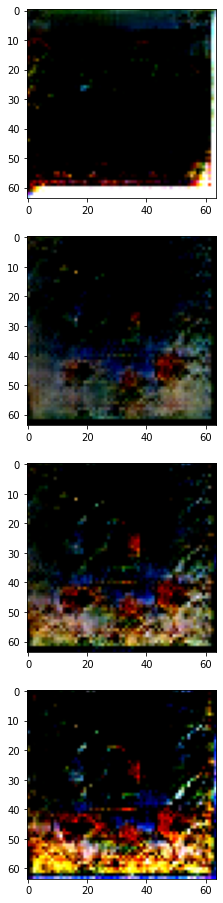

Currently on epoch 146
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.02070334367454052 and Discriminator loss: 0.00032679917057976127
Currently on epoch 147
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.10897758603096008 and Discriminator loss: 0.024008460342884064


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

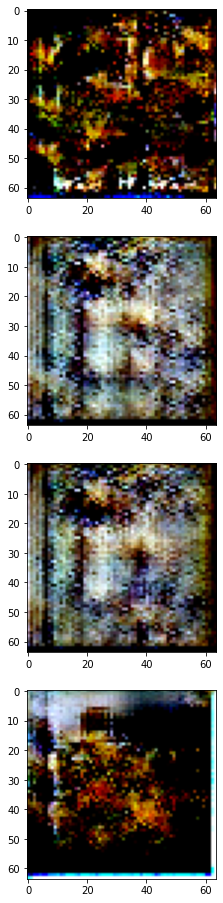

Currently on epoch 149
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.018150007352232933 and Discriminator loss: 8.192313543986529e-06
Currently on epoch 150
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.007681825663894415 and Discriminator loss: 0.001085776719264686


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

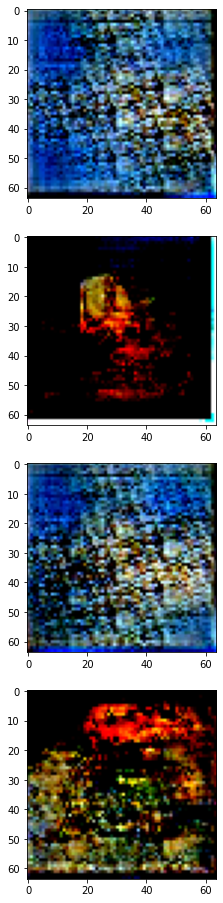

Currently on epoch 152
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 3.5257599353790283 and Discriminator loss: 0.018207447603344917
Currently on epoch 153
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.011668628081679344 and Discriminator loss: 0.0026487805880606174


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

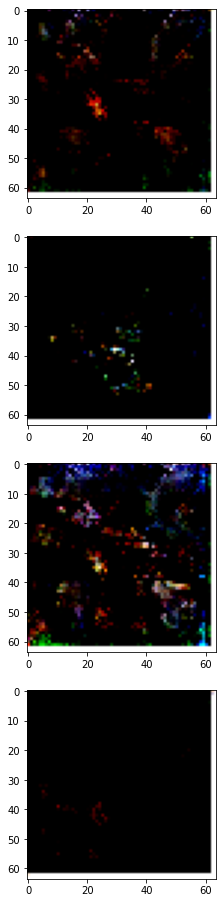

Currently on epoch 155
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.006485372316092253 and Discriminator loss: 0.00012176590826129541
Currently on epoch 156
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.00040147145045921206 and Discriminator loss: 1.1672334949253127e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

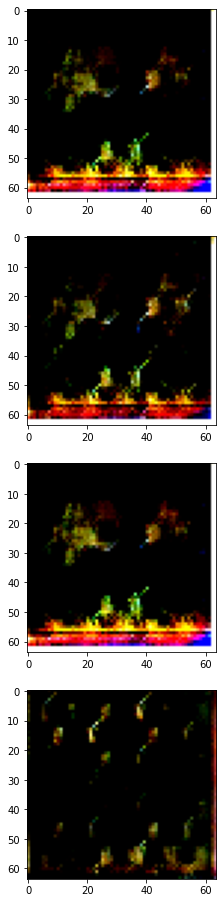

Currently on epoch 158
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.011497607454657555 and Discriminator loss: 0.0007329100626520813
Currently on epoch 159
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.20103953778743744 and Discriminator loss: 0.04052693396806717


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

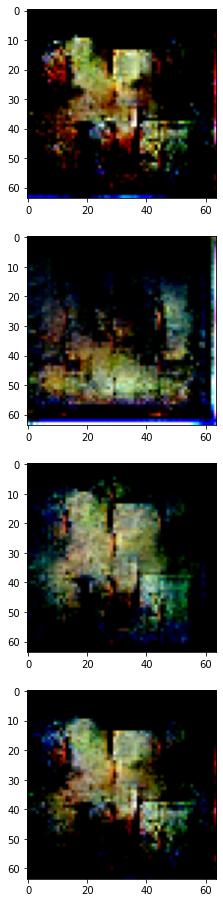

Currently on epoch 161
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.00023587580653838813 and Discriminator loss: 5.9125275583937764e-05
Currently on epoch 162
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch numbe

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 2.4409732818603516 and Discriminator loss: 0.019994119182229042


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

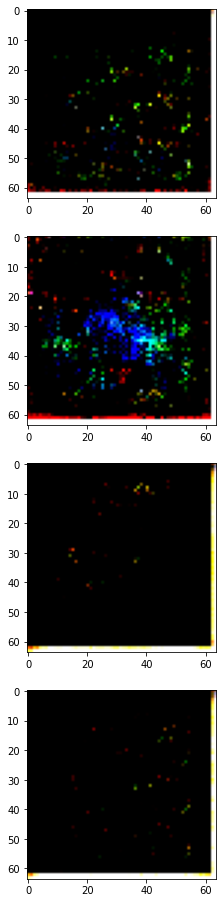

Currently on epoch 164
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0231851227581501 and Discriminator loss: 0.0005410753074102104
Currently on epoch 165
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0016603023977950215 and Discriminator loss: 3.3407973205612507e-06


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

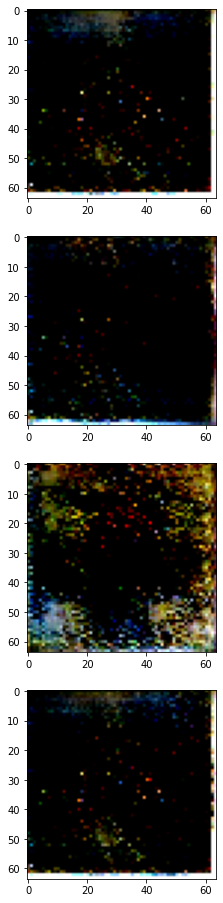

Currently on epoch 167
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.11793254315853119 and Discriminator loss: 8.958583930507302e-05
Currently on epoch 168
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.02199477143585682 and Discriminator loss: 0.0036728528793901205


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

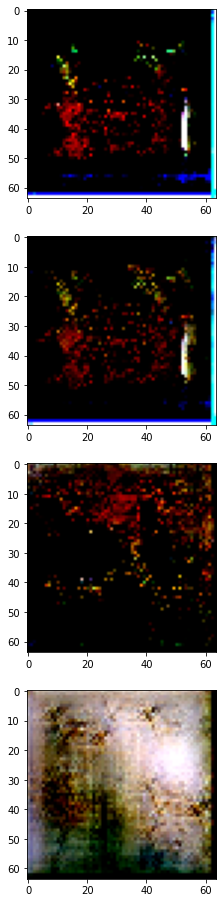

Currently on epoch 170
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0547390878200531 and Discriminator loss: 0.0005233593401499093
Currently on epoch 171
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.001619348768144846 and Discriminator loss: 0.00012633975711651146


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

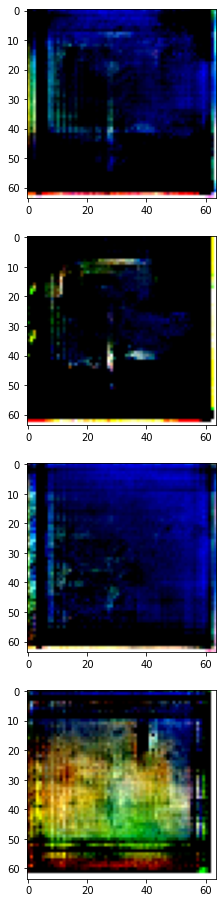

Currently on epoch 173
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.004875564482063055 and Discriminator loss: 2.932945790234953e-05
Currently on epoch 174
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.10820522159337997 and Discriminator loss: 0.0010868512326851487


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

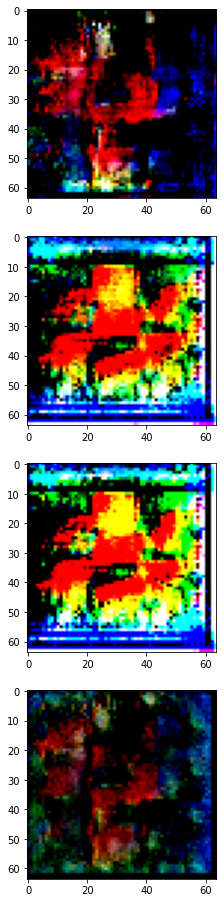

Currently on epoch 176
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.006242299452424049 and Discriminator loss: 0.0008358015329577029
Currently on epoch 177
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.017267560586333275 and Discriminator loss: 6.238776677491842e-07


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

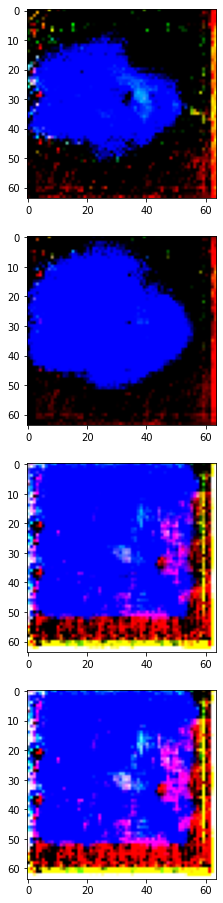

Currently on epoch 179
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.030574513599276543 and Discriminator loss: 0.0002807280980050564
Currently on epoch 180
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.00366629334166646 and Discriminator loss: 0.00014098233077675104


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

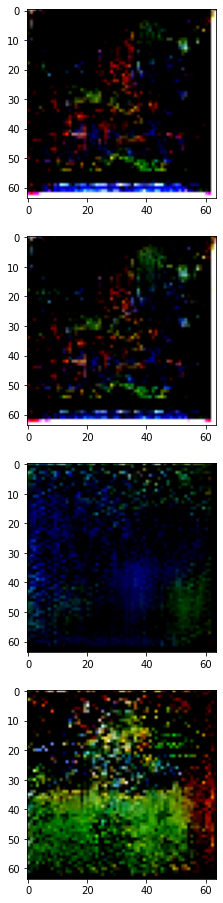

Currently on epoch 182
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.01218128576874733 and Discriminator loss: 1.1690416613419075e-05
Currently on epoch 183
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.010790949687361717 and Discriminator loss: 0.00010971025039907545


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

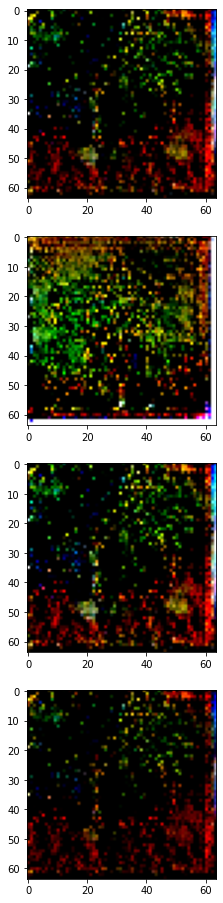

Currently on epoch 185
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.013781833462417126 and Discriminator loss: 0.0002002381079364568
Currently on epoch 186
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.16467462480068207 and Discriminator loss: 0.040160439908504486


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

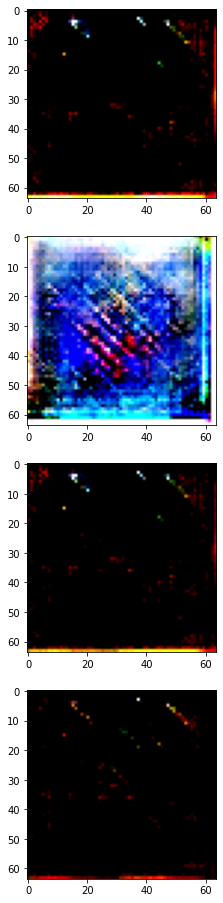

Currently on epoch 188
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.004815112799406052 and Discriminator loss: 0.00014464528067037463
Currently on epoch 189
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.004082222003489733 and Discriminator loss: 2.9086275390000083e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

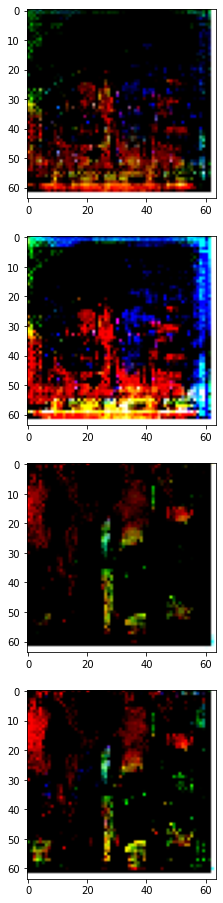

Currently on epoch 191
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0008748247055336833 and Discriminator loss: 0.0055475556291639805
Currently on epoch 192
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0008202606695704162 and Discriminator loss: 1.8075272691930877e-06


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

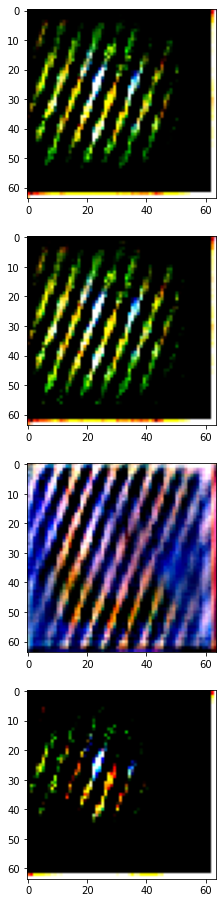

Currently on epoch 194
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.006597628816962242 and Discriminator loss: 1.1671691027004272e-06
Currently on epoch 195
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0015781036345288157 and Discriminator loss: 1.2899472494609654e-05


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

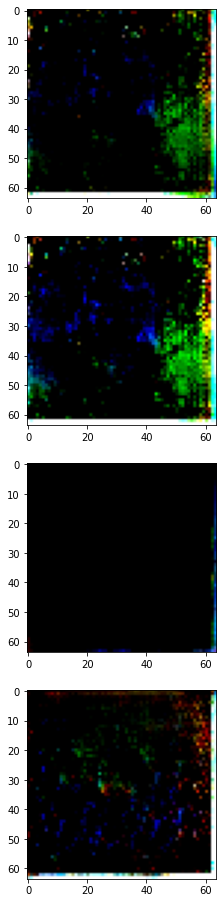

Currently on epoch 197
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 4.18664026260376 and Discriminator loss: 0.00036084666498936713
Currently on epoch 198
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.006659349426627159 and Discriminator loss: 0.00035683155874721706


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

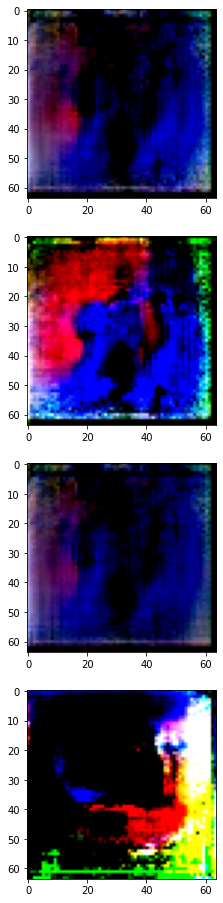

Currently on epoch 200
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0009180656634271145 and Discriminator loss: 9.148241588263772e-06
Currently on epoch 201
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.00692544924095273 and Discriminator loss: 0.0007823953637853265


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

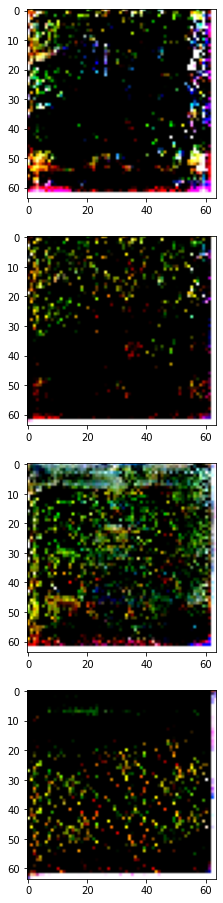

Currently on epoch 203
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.006500726565718651 and Discriminator loss: 0.00017379605560563505
Currently on epoch 204
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0004232521168887615 and Discriminator loss: 0.00020006248087156564


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

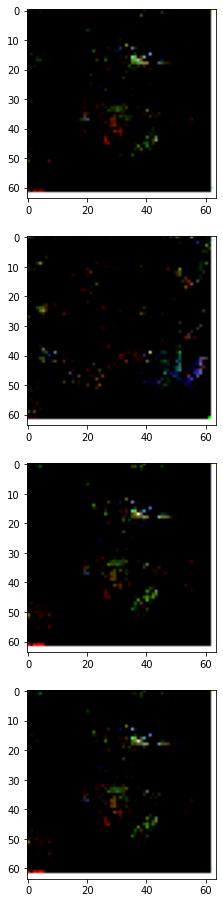

Currently on epoch 206
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 1.4016692638397217 and Discriminator loss: 4.9035959818866104e-05
Currently on epoch 207
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.0001642644638195634 and Discriminator loss: 6.875221515656449e-06


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

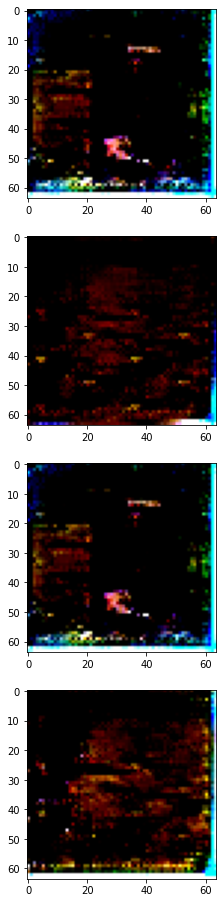

Currently on epoch 209
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.06960377097129822 and Discriminator loss: 0.005697248503565788
Currently on epoch 210
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.048726312816143036 and Discriminator loss: 0.0025180724915117025


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

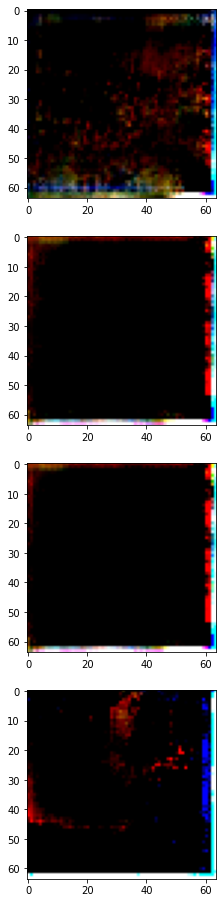

Currently on epoch 212
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0025243579875677824 and Discriminator loss: 0.0004983163089491427
Currently on epoch 213
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.02062862738966942 and Discriminator loss: 0.0001230730558745563


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

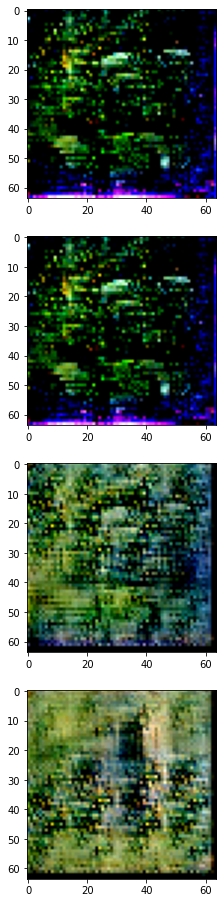

Currently on epoch 215
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.03047236055135727 and Discriminator loss: 0.004815499763935804
Currently on epoch 216
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.17630186676979065 and Discriminator loss: 0.0001934268366312608


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

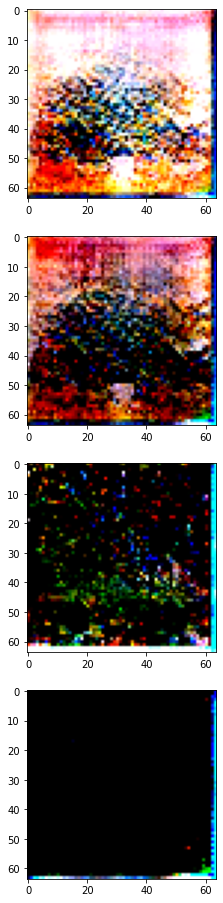

Currently on epoch 218
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.0669131949543953 and Discriminator loss: 0.001268646214157343
Currently on epoch 219
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


	 Generator loss: 0.011179065331816673 and Discriminator loss: 0.00013858206511940807


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

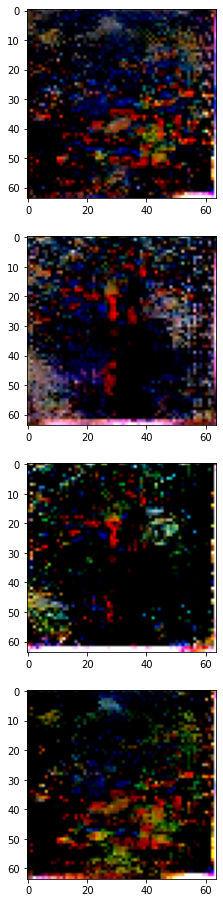

Currently on epoch 221
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 of 135
	 currently on batch number 110 of 135
	 currently on batch number 120 of 135
	 currently on batch number 130 of 135
	 Generator loss: 0.67906653881073 and Discriminator loss: 0.0009638788760639727
Currently on epoch 222
	 currently on batch number 10 of 135
	 currently on batch number 20 of 135
	 currently on batch number 30 of 135
	 currently on batch number 40 of 135
	 currently on batch number 50 of 135
	 currently on batch number 60 of 135
	 currently on batch number 70 of 135
	 currently on batch number 80 of 135
	 currently on batch number 90 of 135
	 currently on batch number 100 o

In [ ]:
coding_size=100
for epoch in range(epochs):
    print(f"Currently on epoch {epoch+1}")
    i=0
    for X_batch in dataset:
        i=i+1
        if i%10 ==0:
            print(f"\t currently on batch number {i} of {len(my_data)//batch_size}")
        noise = tf.random.normal(shape=[batch_size,coding_size])
        gen_images = generator(noise)
        x_fake_vs_real = tf.concat([gen_images, tf.dtypes.cast(X_batch,tf.float32)],axis=0)
        y1 = tf.constant([[0.0]]*batch_size+[[1.0]]*batch_size)
        y1 = np.asarray(y1)
        discriminator.trainable = True
        d_loss = discriminator.train_on_batch(x_fake_vs_real,y1)

        #Train Generator
        noise = tf.random.normal(shape=[batch_size,coding_size])
        y2 = tf.constant([[1.0]]*batch_size)
        g_loss = GAN.train_on_batch(noise,y2)
    print(f"\t Generator loss: {g_loss} and Discriminator loss: {d_loss}")
    noise = tf.random.normal(shape=[10,coding_size])
    images = generator(noise)
    plt.figure()

    if epoch%3 ==0:
      f, axarr = plt.subplots(4,1,figsize=(16,16))
      axarr[0].imshow(cv2.cvtColor((images[0]).numpy(), cv2.COLOR_BGR2RGB)) 
      axarr[1].imshow(cv2.cvtColor((images[1]).numpy(), cv2.COLOR_BGR2RGB))   
      axarr[2].imshow(cv2.cvtColor((images[2]).numpy(), cv2.COLOR_BGR2RGB))  
      axarr[3].imshow(cv2.cvtColor((images[3]).numpy(), cv2.COLOR_BGR2RGB))   
      plt.show()
 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


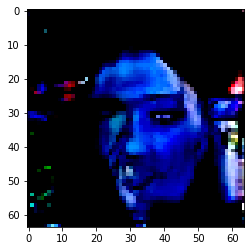

In [ ]:

noise = np.random.normal(0,1 ,size=(10,coding_size))   
gen_images = gen_model.predict_on_batch(noise)
plt.imshow(((images[0])).numpy())



In [ ]:
generator.save('/content')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: /content/assets
